In [2]:
import numpy as np
import scipy as sp
import torch as th

import os, pdb, sys, json, glob, tqdm
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

plt.rcParams['figure.figsize'] = [10, 10]
plt.rcParams['figure.dpi'] = 200
sns.set(context='poster',
        style='ticks',
        font_scale=1,
        rc={'axes.grid':True,
            'grid.color':'.9',
            'grid.linewidth':0.75})
%load_ext autoreload
%autoreload 2

dev = 'cuda'
root = '/home/ubuntu/ext_vol'
import sys
sys.path.insert(0, f'{root}/inpca')
plot_root = '/home/ubuntu/ext_vol/6217ef20ae4596301f213f84/fig'
from utils import get_data, get_idx, get_configs, setup, get_model, explained_stress
from utils import plotly_3d

In [3]:
import plotly.graph_objects as go
import numpy as np
import plotly.offline as pyo
import pandas as pd
import plotly.express as px
import h5py
pyo.init_notebook_mode()

### Visualizing Data

In [6]:
from utils import get_model, get_configs

In [8]:
model_args = get_configs('/home/ubuntu/ext_vol/inpca/configs/model/fc-200-50-5.yaml')
m=get_model(model_args, dev='cpu')

Num parameters:  10250


In [15]:
# nonsloppy
x = th.load('/home/ubuntu/ext_vol/data/synthetic/fc-200-50-5-0.5.pt')['train'].x

In [167]:
data = th.load('/home/ubuntu/ext_vol/data/synthetic/fc-200-50-5-0.001.pt')
data_sloppy = th.load('/home/ubuntu/ext_vol/data/synthetic/fc-200-50-5-0.5.pt')
data_sloppy_1 = th.load('/home/ubuntu/ext_vol/data/synthetic/fc-200-50-5-1.pt')
data_isog = th.load('/home/ubuntu/ext_vol/data/synthetic/fc-200-50-5-0.0.pt')
from utils import get_data
data_cifar = get_data(data_args={'data': 'CIFAR10', 'aug': 'none', 'sub_sample': 0}, resize=1)

In [168]:
x_train = {'non-sloppy': data['train'].x, 'sloppy':data_sloppy['train'].x, 
           'isog':data_isog['train'].x, 'sloppy_1':data_sloppy_1['train'].x,
           'cifar':data_cifar['train'].data
          }
y_train = {'non-sloppy': data['train'].y, 'sloppy':data_sloppy['train'].y, 
           'isog':data_isog['train'].y, 'sloppy_1':data_sloppy_1['train'].y,
          'cifar':data_cifar['train'].targets}

In [29]:
key = 'non-sloppy'
x = x_train[key]

In [23]:
x -= x.mean(1, keepdims=True)
cov = np.cov(x, rowvar = False)
e, v = np.linalg.eigh(cov)
idx = np.argsort(e)[::-1]
v = v[:,idx]
e = e[idx]

a = np.dot(x, v) 

Below are two plots of the first two dimension of synthetic sloppy vs non-sloppy data. We can see sloppy data are more distinguishable in the first few dimension, and non-sloppy data has a more isotropic distribution.

Text(0.5, 1.0, 'non-sloppy data')

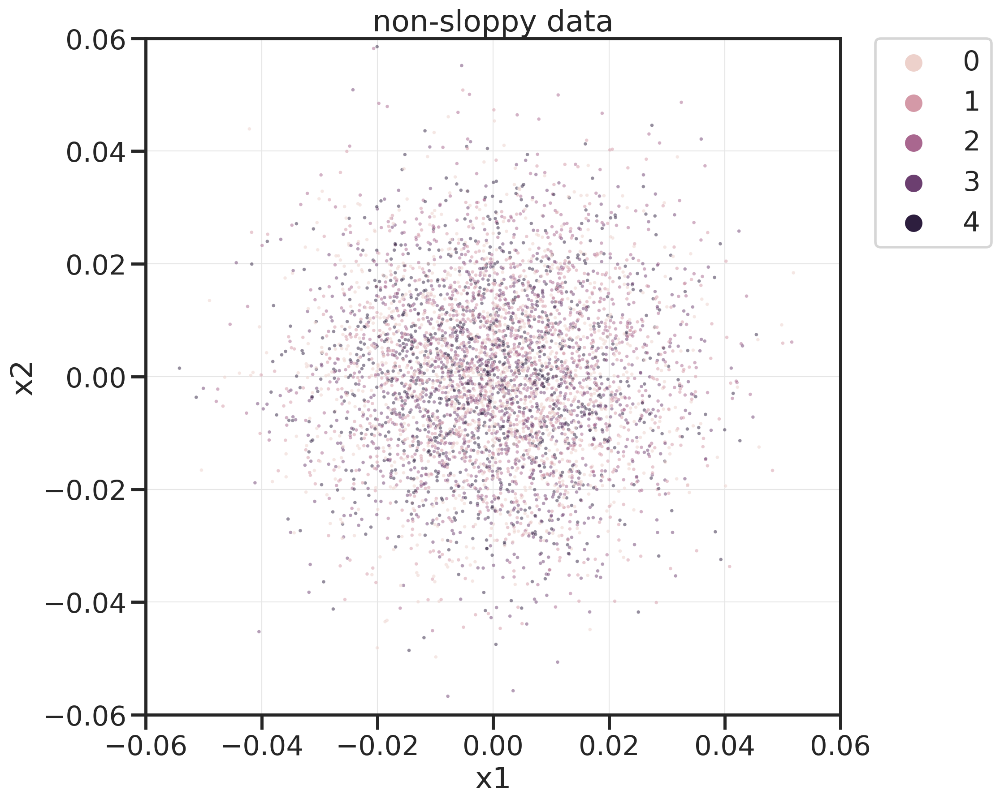

In [30]:
data = pd.DataFrame(np.hstack([x[:, :1], x[:, 1:2]]), columns=['x1', 'x2'])
data.loc[:, 'y'] = y_train[key].numpy()
ax=sns.scatterplot(data=data, x='x1', y='x2', hue='y', alpha=0.5, s=8)
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)
ax.set(xlim=[-0.06, 0.06], ylim=[-0.06, 0.06])
ax.set_title(f'{key} data')

Text(0.5, 1.0, 'sloppy data')

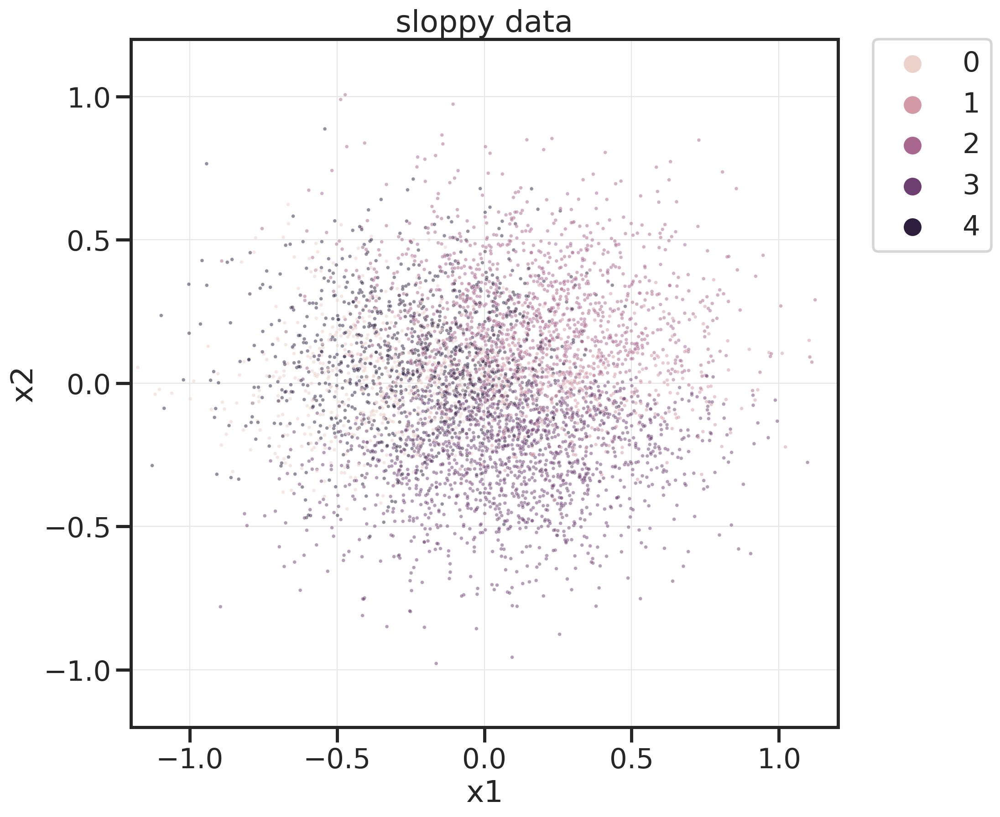

In [34]:
data = pd.DataFrame(np.hstack([x[:, :1], x[:, 1:2]]), columns=['x1', 'x2'])
data.loc[:, 'y'] = y_train[key].numpy()
ax=sns.scatterplot(data=data, x='x1', y='x2', hue='y', alpha=0.5, s=8)
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)
ax.set(xlim=[-1.2, 1.2], ylim=[-1.2, 1.2])
ax.set_title(f'{key} data')

Text(0.5, 1.0, 'non-sloppy data')

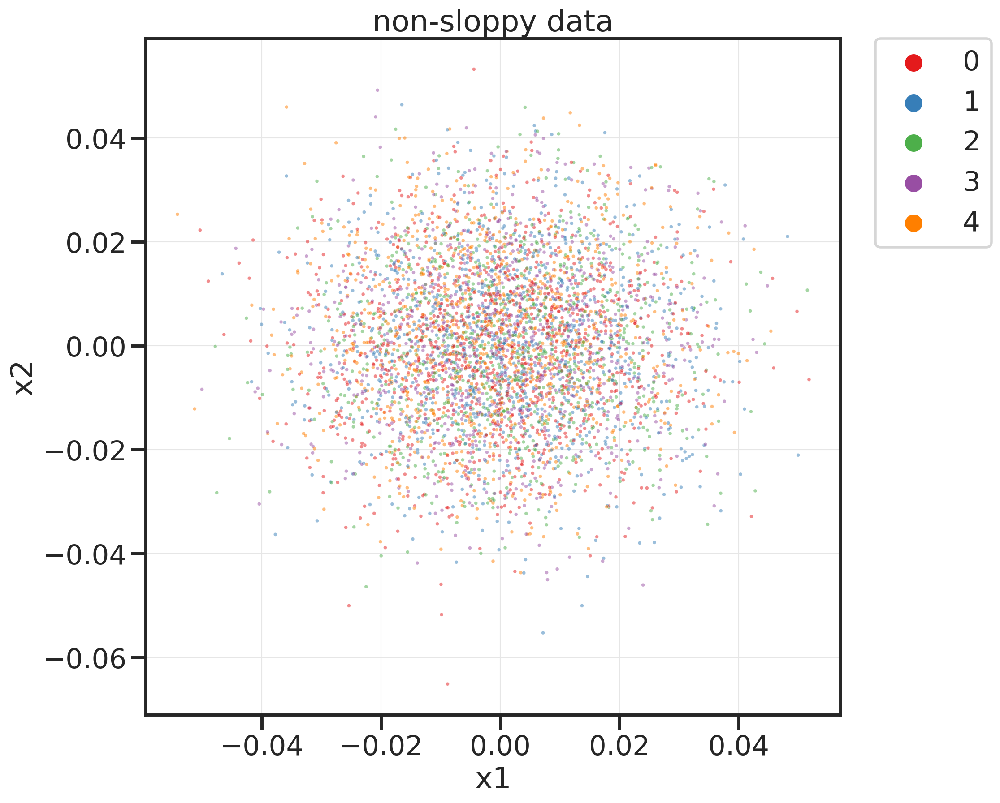

In [30]:
data = pd.DataFrame(np.hstack([x[:, :1], x[:, 10:11]]), columns=['x1', 'x2'])
data.loc[:, 'y'] = y_train[key].numpy()
ax=sns.scatterplot(data=data, x='x1', y='x2', hue='y', alpha=0.5, palette='Set1', s=8)
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)
# ax.set(xlim=[-0.3, 0.3], ylim=[-0.3, 0.3])
ax.set_title(f'{key} data')

Text(0.5, 1.0, 'sloppy data')

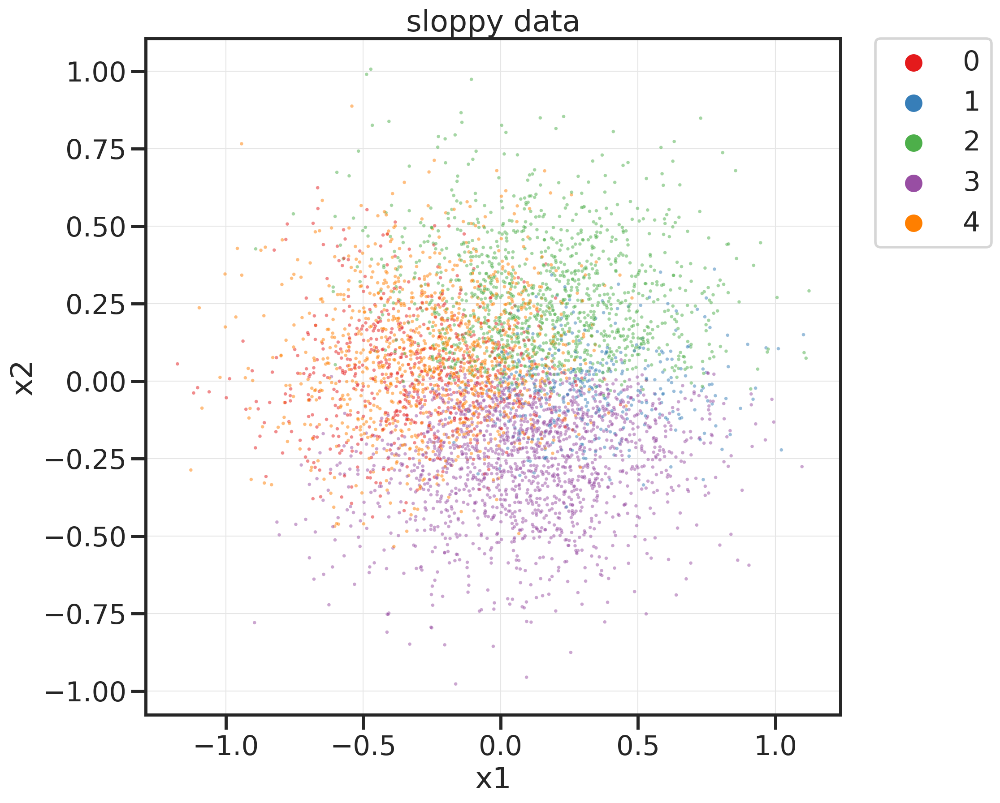

In [28]:
data = pd.DataFrame(np.hstack([x[:, :1], x[:, 1:2]]), columns=['x1', 'x2'])
data.loc[:, 'y'] = y_train[key].numpy()
ax=sns.scatterplot(data=data, x='x1', y='x2', hue='y', alpha=0.5, s=8, palette='Set1')
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)
# ax.set(xlim=[-0.06, 0.06], ylim=[-0.06, 0.06])
ax.set_title(f'{key} data')

In [169]:
evals={}
for key in ['isog', 'non-sloppy', 'sloppy', 'cifar']:
    x = x_train[key]
    num_train = x.shape[0]
    x = x.reshape([num_train, -1])
    if key == 'cifar':
        x=x.astype('float64')
    x -= x.mean(0, keepdims=True)
    e,v = np.linalg.eigh(x.T@x / num_train)
    e /= e.max()
    ii = np.argsort(np.real(e))[::-1]
    e = np.clip(e[ii], a_min=1e-15, a_max=None)
    evals[key] = e

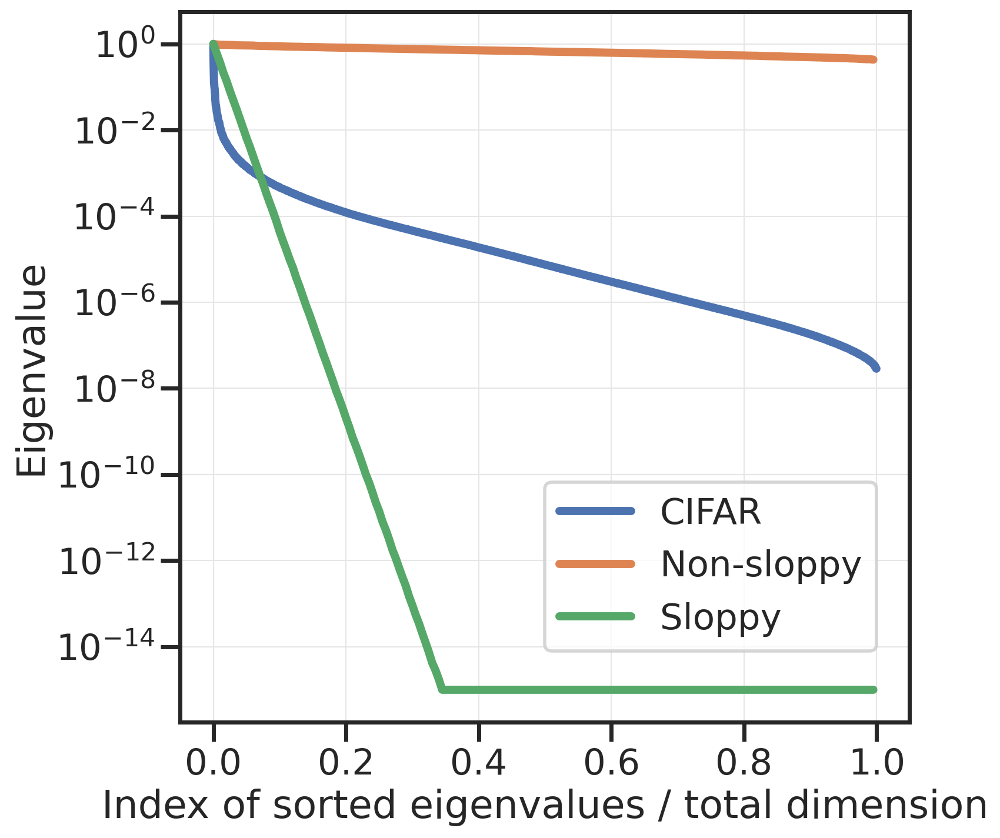

In [172]:
f, ax=plt.subplots(figsize=(8, 8))
for key in ['cifar','non-sloppy', 'sloppy']:
    if key=='cifar':
        label='CIFAR'
    elif key=='non-sloppy':
        label='Non-sloppy'
    else:
        label='Sloppy'
    sns.lineplot(x=np.arange(len(evals[key]))/len(evals[key]), y=evals[key], ax=ax, label=label, lw=5)
ax.set(xlabel='Index of sorted eigenvalues / total dimension', ylabel='Eigenvalue', yscale='log')
sns.move_legend(ax, [0.5, 0.1])

In [173]:
f.savefig(f'{plot_root}/input_evals_all.pdf', bbox_inches='tight')

[Text(0.5, 0, 'Index of sorted eigenvalues'), Text(0, 0.5, 'Eigenvalue'), None]

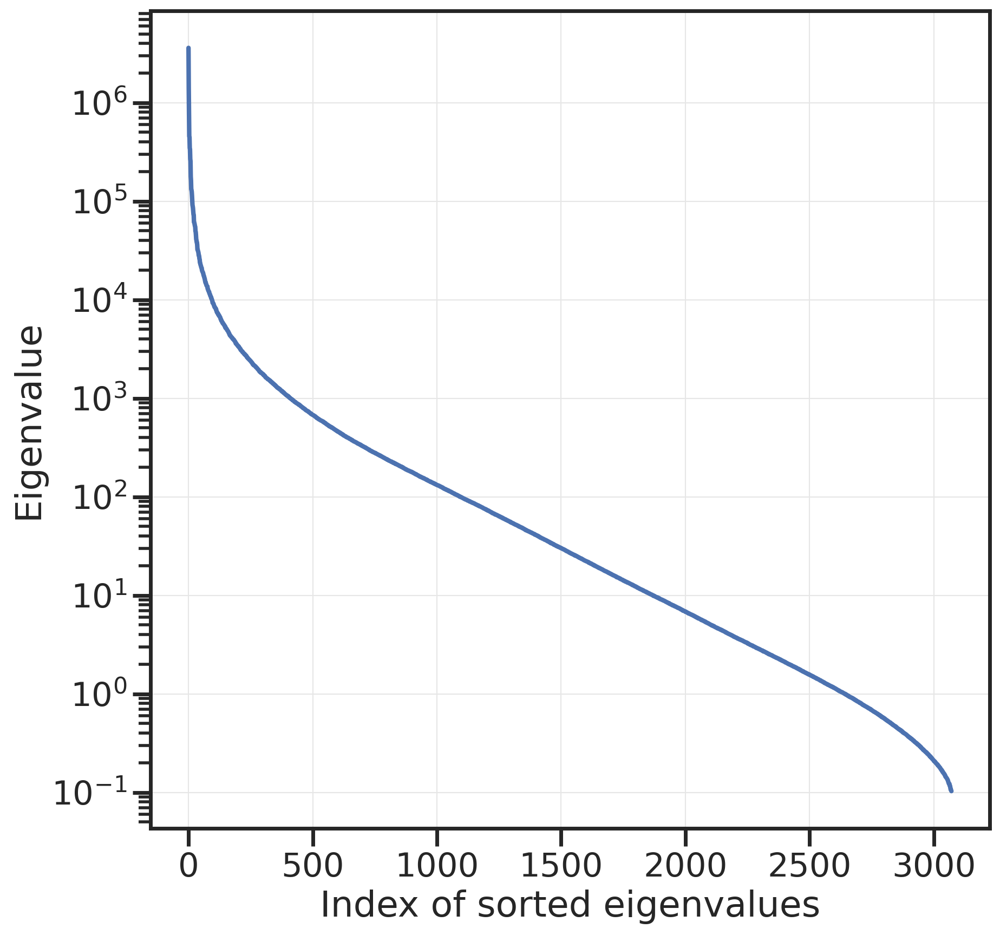

In [56]:
ii = np.argsort(np.real(e))[::-1]
e = e[ii]
f, ax=plt.subplots()
sns.lineplot(x=np.arange(len(e)), y=np.real(e), ax=ax)
ax.set(xlabel='Index of sorted eigenvalues', ylabel='Eigenvalue', yscale='log')

In [57]:
f.savefig('/home/ubuntu/ext_vol/6217ef20ae4596301f213f84/fig/evals_cifar.pdf')

### Compute projection

In [ ]:
ax.set(ylim=(0.4, 1.01), xlabel='# Dimension', ylabel='Explained stress')

In [191]:
from utils import dinpca
import h5py
key = "yh"
data = "nonsloppy"
didx = th.load(f'/home/ubuntu/ext_vol/inpca/inpca_results_all/synth/didx_{data}_ignorance.p')
r = th.load(f'/home/ubuntu/ext_vol/inpca/inpca_results_all/synth/r_{key}_{data}_ignorance.p')
with h5py.File(f'/home/ubuntu/ext_vol/inpca/inpca_results_all/synth/w_{key}_{data}_ignorance.h5', 'r') as f:
    w = f['w'][:]
dmean = w.mean(0, keepdims=True)
w = w - dmean
w = w - w.mean(1, keepdims=True)
w = w*(-0.5)
j = 3
wh = r['xp'][:, :j] @ np.diag(np.sign(r['e'][:j])) @ r['xp'][:, :j].T - w

In [192]:
wh = np.abs(wh)

In [193]:
cols = ['m', 'opt', 'bs', 'aug', 'lr', 'wd']
rows = didx.iloc[np.arange(0, len(didx), 67)][cols].astype(str)

In [194]:
ii = didx[didx.seed==42].index
d42 = didx.iloc[ii].reset_index(drop=True)

In [195]:
cols = ['m', 'opt', 'bs', 'wd', 't']
rows = d42.iloc[np.arange(0, len(d42), 67)][cols].astype(str)

[Text(0.5, 1.0, 'nonsloppy')]

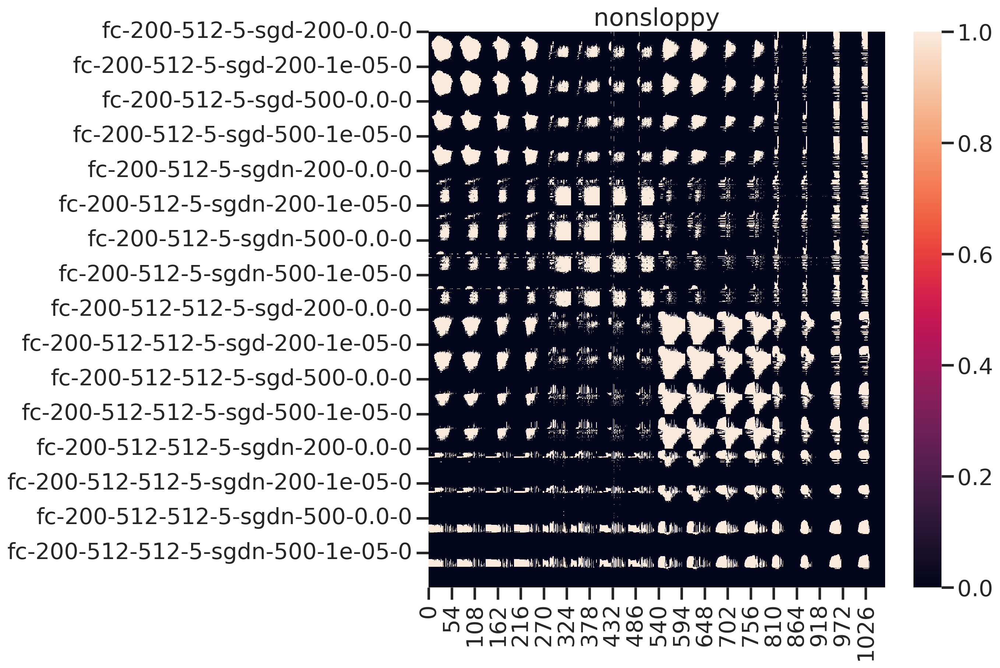

In [196]:
ax = sns.heatmap((wh > (wh.mean()+wh.std()))[ii, :][:, ii])
ticks=ax.set_yticks(np.arange(0, len(d42), 67), rows.apply('-'.join, axis=1).values)
ax.set(title=data)

[Text(0.5, 1.0, 'sloppy_0.5')]

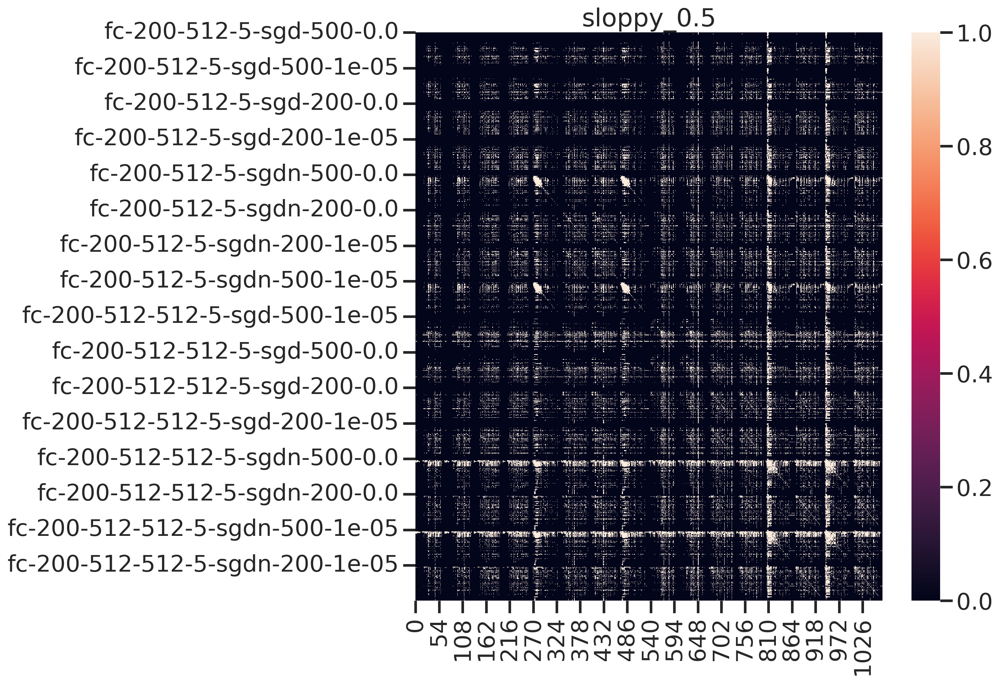

In [172]:
ax = sns.heatmap((wh > (wh.mean()+wh.std()))[ii, :][:, ii])
ticks=ax.set_yticks(np.arange(0, len(d42), 67), rows.apply('-'.join, axis=1).values)
ax.set(title=data)

### Synthetic Data random label

#### sloppy

In [62]:
key = "yh"
data = "nonsloppy"
didx = th.load(f'/home/ubuntu/ext_vol/inpca/inpca_results_all/synth/didx_{data}_ignorance.p')
r = th.load(f'/home/ubuntu/ext_vol/inpca/inpca_results_all/synth/r_{key}_{data}_ignorance.p')

In [ ]:
emph = get_idx(didx, "m=='geodesic'")
fig = plotly_3d(didx, r, emph=emph, empcolor='red', empsize=3, empmode='markers',
              ne=3, dims=[1, 2, 3],
              cols=['seed', 'm', 'opt', 'err', 'verr', 'bs', 'aug', 'lr', 'wd', 't'],
              color='t',  colorscale='RdBu')

fig.show()

In [ ]:
triplot(didx.reset_index(drop=True), r, d=5, cmap='vlag', cdict=None, ckey='t', 
            markers=["o", "x", "s", "*", "+"],
            evals=False, plot_avg=False, xrange=[-0.75, 0.75], yrange=[-0.75, 0.75]
            )

#### non-sloppy

In [ ]:
didx = th.load('/home/ubuntu/ext_vol/inpca/inpca_results/didx_yh_nonsloppy-random.p')['dc'].reset_index(drop=True)
w = th.load('/home/ubuntu/ext_vol/inpca/inpca_results/w_yh_nonsloppy-random.p')

In [15]:
linkage, cluster, corr_array = cluster_corr(pdists)

pdists...
cluster...


In [ ]:
from embed import proj_
l = np.eye(w.shape[0]) - 1.0/w.shape[0]
w = -l @ w @ l / 2
r = proj_(w, w.shape[0], 3)
r['fn'] = np.linalg.norm(w, ord='fro')

In [ ]:
emph = get_idx(didx, "m=='geodesic'")
fig = plotly_3d(didx, r, emph=[emph], empcolor='red', empsize=3, empmode='markers',
              return_text=False, return_d=False, ne=3, dims=[1, 2, 3],
              cols=['seed', 'm', 'opt', 'err', 'verr', 'bs', 'aug', 'lr', 'wd', 'init'],
              groups = ['seed', 'm', 'opt', 'bs', 'aug', 'lr', 'wd'],
              color='t', cmap=None, colorscale='RdBu', mode='markers', separate_traj=False, axis_range=[-0.75, 0.75])[0]

fig.show()

Smaller class size, larger sloppiness factor. See a low dimensional "fan" near the end of training.

In [ ]:
emph = get_idx(didx, "m=='geodesic'")
fig = plotly_3d(didx, r, emph=[emph], empcolor='red', empsize=3, empmode='markers',
              return_text=False, return_d=False, ne=3, dims=[1, 2, 3],
              cols=['seed', 'm', 'opt', 'err', 'verr', 'bs', 'aug', 'lr', 'wd'],
              groups = ['seed', 'm', 'opt', 'bs', 'aug', 'lr', 'wd'],
              color='t', cmap=None, colorscale='RdBu', mode='markers', separate_traj=False, axis_range=[-0.75, 0.75])[0]

fig.show()

In [ ]:
df = pd.DataFrame(dict(eval_idx=np.arange(len(r['e'])), err=1 - np.sqrt(1-np.cumsum(r['e'] ** 2)/r['fn']**2)))
plt.figure(figsize=(8,6))
g=sns.lineplot(data=df, x='eval_idx', y='err', marker="o")

In [ ]:
triplot(didx.reset_index(drop=True), r, emph=[emph], d=5, cmap='vlag', cdict=None, ckey='t', 
            markers=["o", "x", "s", "*", "+"],
            evals=False, plot_avg=False, xrange=[-0.75, 0.75], yrange=[-0.75, 0.75]
            )

## Different labeling

In [ ]:
fn = 'yh_sloppy-50-50'
didx = th.load(f'/home/ubuntu/ext_vol/inpca/inpca_results/didx_{fn}.p')['dc'].reset_index(drop=True)
w = th.load(f'/home/ubuntu/ext_vol/inpca/inpca_results/w_{fn}.p')

In [ ]:
from embed import proj_

l = np.eye(w.shape[0]) - 1.0/w.shape[0]
w = -l @ w @ l / 2
r = proj_(w, w.shape[0], 3)
r['fn'] = np.linalg.norm(w, ord='fro')

In [ ]:
th.save(r, f'/home/ubuntu/ext_vol/inpca/inpca_results/r_{fn}.p')

In [ ]:
r = th.load(f'/home/ubuntu/ext_vol/inpca/inpca_results/r_{fn}.p')

In [ ]:
for (c, ii) in didx.groupby(['seed', 'm','opt','bs','aug','lr','wd']).indices.items():
    tmax = didx.iloc[ii].t.max()
    didx.loc[ii, 't'] /= tmax

In [ ]:
df = pd.DataFrame(dict(eval_idx=np.arange(len(r['e'])), err=1 - np.sqrt(1-np.cumsum(r['e'] ** 2)/r['fn']**2)))
plt.figure(figsize=(8,6))
g=sns.lineplot(data=df, x='eval_idx', y='err', marker="o")

In [ ]:
emph = get_idx(didx, "m=='geodesic'")
fig = plotly_3d(didx, r, emph=[], empcolor='red', empsize=3, empmode='markers',
              return_text=False, return_d=False, ne=3, dims=[1, 2, 3],
              cols=['seed', 'm', 'opt', 'err', 'verr', 'bs', 'aug', 'lr', 'wd'],
              groups = ['seed', 'm', 'opt', 'bs', 'aug', 'lr', 'wd'],
              color='t', cmap=None, colorscale='RdBu', mode='markers', separate_traj=False, axis_range=[-0.75, 0.75])[0]

fig.show()

In [ ]:
emph = get_idx(didx, "m=='geodesic'")
fig = plotly_3d(didx, r, emph=[], empcolor='red', empsize=3, empmode='markers',
              return_text=False, return_d=False, ne=3, dims=[1, 2, 3],
              cols=['seed', 'm', 'opt', 'err', 'verr', 'bs', 'aug', 'lr', 'wd'],
              groups = ['seed', 'm', 'opt', 'bs', 'aug', 'lr', 'wd'],
              color='t', cmap=None, colorscale='RdBu', mode='markers', separate_traj=False, axis_range=[-0.75, 0.75])[0]

fig.show()

In [ ]:
triplot(didx.reset_index(drop=True), r, emph=[emph], d=5, cmap='vlag', cdict=None, ckey='t', 
            markers=["o", "x", "s", "*", "+"],
            evals=False, plot_avg=False, xrange=[-0.75, 0.75], yrange=[-0.75, 0.75]
            )

### Init kernels

In [52]:
def relu(x):
    return x*(x > 0)

In [53]:
def drelu(x):
    return np.sign(x)/2+0.5

In [91]:
d = 200
h = 512
w = (th.rand(h, d) - 0.5)/np.sqrt(d)
a = (th.rand(1, h) - 0.5)/np.sqrt(h)
evals = {}
for c in [0.001, 0.1, 0.5, 0.8, 1]:
    b = 50*c if c > 0 else 1
    evs = b*th.exp(-c*th.arange(d))
    x = (th.randn(5000, d) @ th.diag(th.sqrt(evs / d))).reshape(-1, 200)
    K = (drelu(x@w.T) @ np.diag(a.squeeze()**2) @ drelu(w@x.T)) * (x@x.T)
    e, v = np.linalg.eigh(K)
    ii = np.argsort(np.abs(e))[::-1]
    evals[c] = e[ii]

In [92]:
pd.DataFrame(evals)

,0.001,0.100,0.500,0.800,1.000
0,0.035968,2.682464,13.086794,2.160115e+01,2.711504e+01
1,0.035828,2.497841,8.238318,1.362476e+01,1.832615e+01
2,0.035599,2.257886,7.023456,9.805728e+00,9.859053e+00
3,0.035164,2.035820,4.797438,4.338319e+00,5.182086e+00
4,0.034839,1.828812,3.045966,4.267896e+00,3.758758e+00
...,...,...,...,...,...
4995,0.000359,0.000219,0.000001,2.164760e-08,4.871504e-10
4996,0.000358,0.000218,0.000001,2.079094e-08,4.725832e-10
4997,0.000358,0.000217,0.000001,1.953961e-08,3.187025e-10
4998,0.000357,0.000216,0.000001,1.819469e-08,-2.179131e-10


[None]

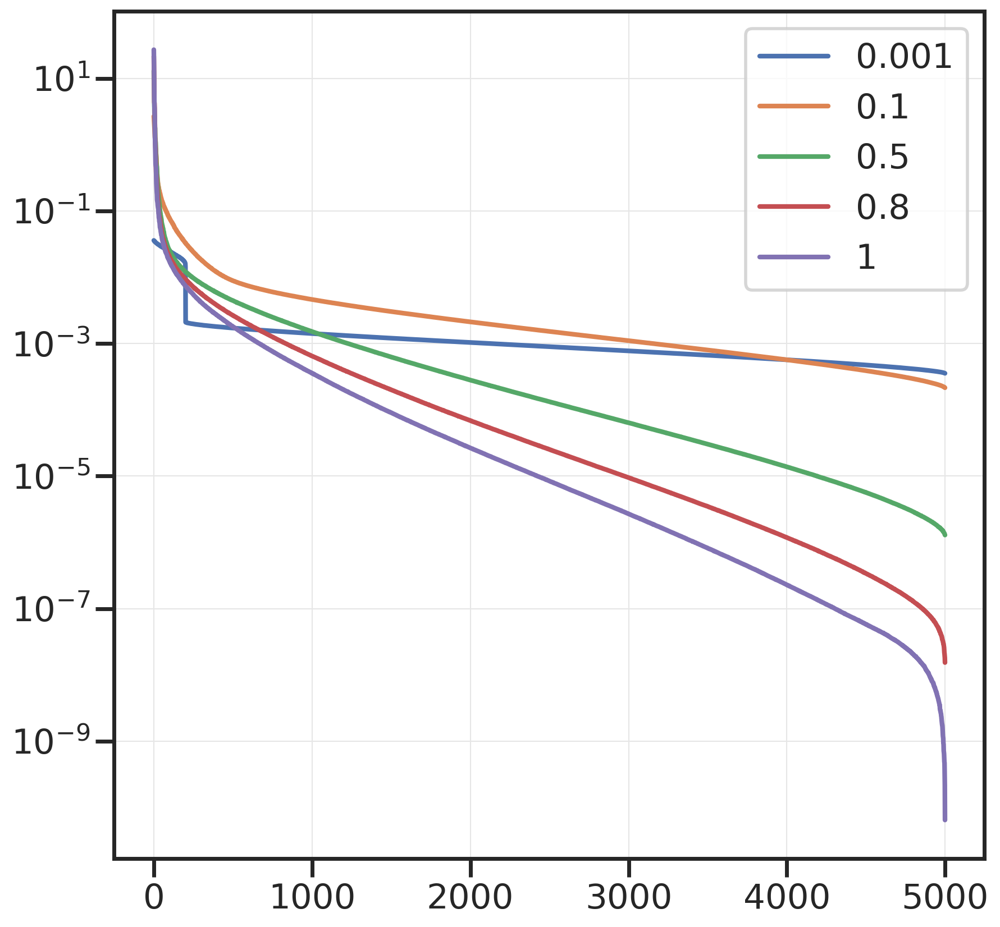

In [94]:
f, ax=plt.subplots()
for c in [0.001, 0.1, 0.5, 0.8, 1]:
    ax=sns.lineplot(x=np.arange(len(ii)), y=np.abs(evals[c]), label=c)
ax.set(yscale='log')

[None]

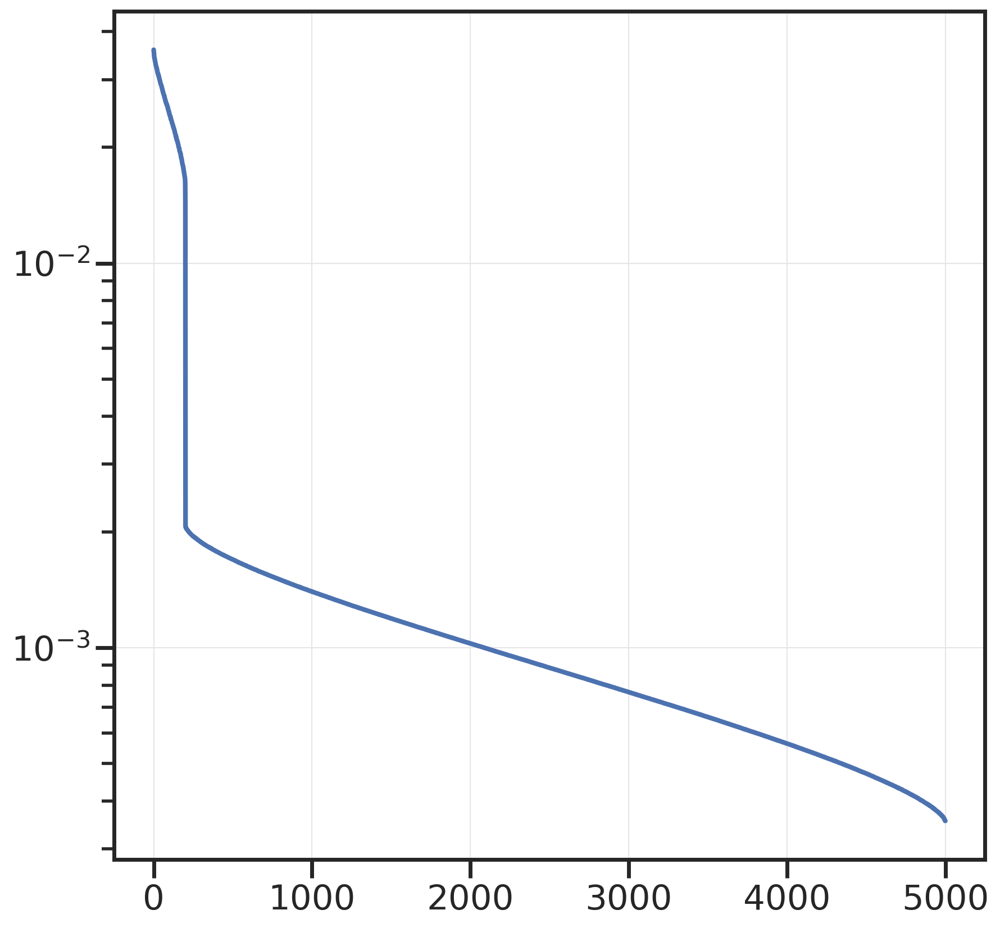

In [84]:
ii = np.argsort(np.abs(e))[::-1]
e = e[ii]
ax=sns.lineplot(x=np.arange(len(ii)), y=np.abs(e))
ax.set(yscale='log')

### Tangent vectors

In [8]:
from utils import load_d
from reparameterization import gamma
from utils.distance import dbhat
from utils import lazy_embed, proj_

In [9]:
def numerical_deriv(y,i,winlen):
    # y [T, N, C]
    derivative_ = 0
    for j in range(1,winlen):
        derivative_ +=(y[i+j,:,:]-y[i-j,:,:])/(2*j)
    return derivative_/(winlen-1)

In [10]:
N = 5000
C = 5
fn = 'sloppy-50'
data = th.load('/home/ubuntu/ext_vol/data/synthetic/fc-200-50-5-0.5.pt')
truth = np.zeros([N, C])
truth[np.arange(N), data['train'].y] = 1
ignorance = np.ones((N,C))/C
geod = np.stack([gamma(t, np.sqrt(ignorance), truth) ** 2 for t in np.linspace(0, 1, 50)])

In [11]:
all_files = glob.glob(f'/home/ubuntu/ext_vol/inpca/results/models/{fn}/*.p')

In [12]:
dinits = []
dfins = []
for f in all_files:
    d = load_d([f])
    yh = np.stack(d.yh)
    dinits.append(numerical_deriv(yh[:10, :, :], 5, 5))
    dfins.append(numerical_deriv(yh[-10:, :, :], 5, 5))

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  8.11it/s]


100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  8.52it/s]


100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.28it/s]


In [13]:
dinit = np.stack(dinits)
dfin = np.stack(dfins)

In [14]:
dinit_ = dinit.reshape(dinit.shape[0], -1)
dfin_ = dfin.reshape(dfin.shape[0], -1)

In [15]:
from sklearn.decomposition import PCA

In [16]:
pca = PCA(n_components=9)
pca.fit(dinit_.T)
pca.explained_variance_ratio_

array([0.11189462, 0.07047426, 0.05148734, 0.04770784, 0.04033817,
       0.03994236, 0.0379397 , 0.03735605, 0.03423116])

In [17]:
avg_tangent_init_ = PCA(n_components=9).fit_transform(dinit_.T)[:, 0].reshape([N, C])
avg_tangent_fin_ = dfin.mean(0)

In [18]:
avg_tangent_init_ = dinit.mean(0)
avg_tangent_fin_ = dfin.mean(0)

In [19]:
init_ray_list = np.array([ignorance +avg_tangent_init_*i for i in np.linspace(0,50,50)])
init_ray_list[init_ray_list<0] = 0
init_ray_list /= np.sum(init_ray_list,2,keepdims = True)

In [20]:
all_tangents_init = np.vstack([ignorance[None, :, :] +dinit*i for i in np.linspace(0,50,50)])
all_tangents_init[all_tangents_init<0] = 0
all_tangents_init /= np.sum(all_tangents_init,2,keepdims = True)

In [21]:
end_ray_list = np.array([truth - avg_tangent_fin_*i for i in np.linspace(0,50,50)])
end_ray_list[end_ray_list<0] = 0
end_ray_list /= np.sum(end_ray_list,2,keepdims = True)

In [22]:
all_tangents_end = np.vstack([truth[None, :, :] - dfin*i for i in np.linspace(0,50,50)])
all_tangents_end[all_tangents_end<0] = 0
all_tangents_end /= np.sum(all_tangents_end,2,keepdims = True)

In [23]:
all_points = np.vstack([init_ray_list, end_ray_list, geod])
all_points /= all_points.sum(-1, keepdims=True)

In [24]:
w = dbhat(th.Tensor(all_points), th.Tensor(all_points), chunks=5000)

In [25]:
all_tangents = np.vstack([all_tangents_init, all_tangents_end])
dextra = dbhat(th.Tensor(all_points), th.Tensor(all_tangents), chunks=500)

In [26]:
n = len(w)
ne = 3
d_mean = w.mean(0)
l = np.eye(w.shape[0]) - 1.0 / w.shape[0]
w = -l @ w @ l / 2
r = proj_(w, n, ne)

Projecting


In [27]:
r['xp'].shape

(150, 9)

In [28]:
df = pd.DataFrame(r['xp'], columns=[f'x{i}' for i in range(r['xp'].shape[1])])
df.loc[:50, 'src'] = 'init_mean'
df.loc[50:100, 'src'] = 'end_mean'
df.loc[100:150, 'src'] = 'geod'

In [29]:
xx = lazy_embed(dp=dextra.T, evals=r['e'], evecs=r['v'], d_mean=d_mean)
allxx = np.vstack([r['xp'], xx])

In [30]:
df = pd.DataFrame(allxx, columns=[f'x{i}' for i in range(r['xp'].shape[1])])
df.loc[:50, 'src'] = 'init_mean'
df.loc[50:100, 'src'] = 'end_mean'
df.loc[100:150, 'src'] = 'geod'
df.loc[150:150+8000, 'src'] = 'init'
df.loc[150+8000:150+16000, 'src'] = 'end'

In [31]:
import plotly.express as px
axis_range = [-0.5, 0.5]
fig = px.scatter_3d(df, x='x0', y='x1', z='x2', color='src')
fig.update_traces(marker=dict(size=2))
fig.update_layout(
            autosize=False,
        width=1000,
        height=1000,
        scene_xaxis_range=axis_range,
    scene_yaxis_range=axis_range,
    scene_zaxis_range=axis_range,
    scene_aspectmode='cube')
fig.show()